# 0 Problem Definition

**This notebook is to design a Geopolitical Risk (Conflict) Index based news data.**

**GPR definition:**

Define the GPR as the expectation, realization, and escalation of adverse news events associated with 7 main indicators among cities, states and countries. These compoents cover Confilict (external and domestic), Terror Threat, Corruption, Environment(air, land, water), Social, Governance (corporate and government) and Forgien Policy.

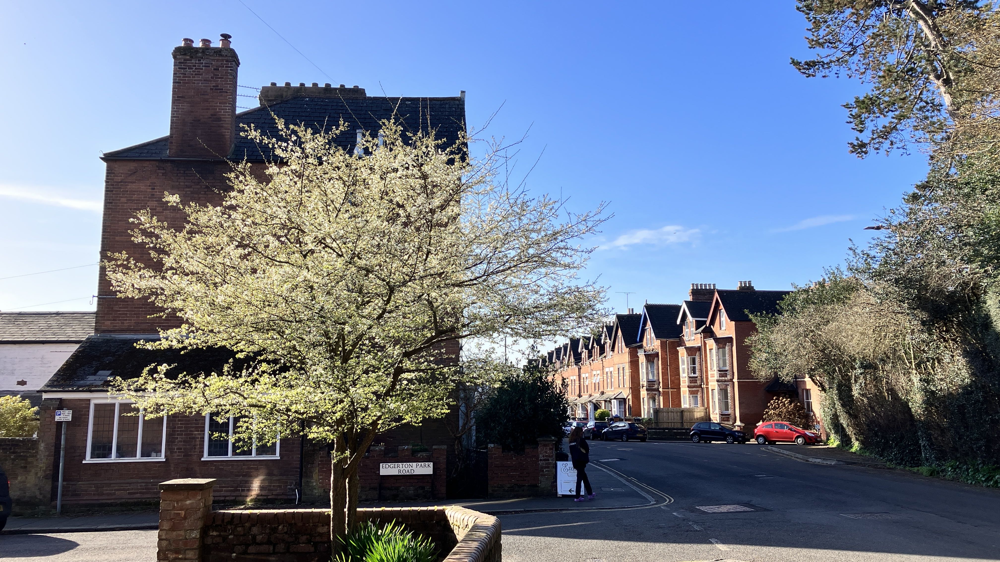

# 1. Load Libraries

In [1]:
# Load libraries
import numpy as np
import pandas as pd
from pandas import read_excel, set_option
from tqdm import tqdm
# pio.renderers.default = 'colab'
pd.set_option('display.max_rows', 20)
pd.set_option('display.max_columns', 50)

import pycountry

import plotly
import plotly.express as px
import plotly.graph_objects as go
import chart_studio.plotly as py
import plotly.figure_factory as ff
import plotly.offline as py
py.init_notebook_mode()
import cufflinks
import datetime
# from multiprocessing import Pool, cpu_count
import os
from time import time

from plotly.offline import iplot
import cufflinks as cf
cf.go_offline()
# colab plot display
import plotly.io as pio

In [2]:
import pycountry
def Pycountry_2_to_3(alpha_2):
    try:
        return pycountry.countries.get(alpha_2=alpha_2).alpha_3
    except:
        return None

**Please go to section 4 directly since section 2 and 3 are to prepare dataset for conflict topic scoring which is the objective of this task.**

# 2. Load Data

This news dataset is already geolocated. Details see notebook `NewsAPP.ipynb`

Download the dataset [All_compoents_news_GPE_SA_GPR_CLF_20211101_20220822_new.csv](https://drive.google.com/file/d/1-BQtKeanq0os4wdY5R0TAlAysnN4iFtA/view?usp=sharing)

In [1]:
df_news = pd.read_csv('data/All_compoents_news_GPE_SA_GPR_CLF_20211101_20220822_new.csv', index_col=0, low_memory=False,lineterminator='\n')

In [43]:
df_news.head(1)

,NewsArticleId,date,date_int,Symantic,LocationId,LocationName,CountryCode,FeatureCode,FeatureClass,CountryGeoNameId,StateCode,StateGeoNameId,Population,Longitude,Latitude,Frequency,Probability,pred_class,LocationTypeId
0,a12313b7e6f7465e8c9a7491b960799e,2021-11-01,20211101,0.9965,4717560.0,Paris,US,PPLA2,P,6252001.0,TX,4736286.0,24782.0,-95.55551,33.66094,13.0,0.7325,10,1


In [44]:
df_news.shape

(3344899, 19)

# 3. Descriptive Analysis

In [45]:
df_news.shape

(3344899, 19)

In [46]:
df_news.pred_class.unique()

array([10,  9,  4,  2,  5,  1,  3])

|class|name|
|--|--|
|1|Conflict|
|2|Terror Threat|
|3|Corruption|
|4|Social|
|5|Governance|
|9|Foreign Policy|
|10|Environment|


In [47]:
df_news[['Symantic','Population','pred_class','Probability']].describe().round(2)

,Symantic,Population,pred_class,Probability
count,3344899.00,3.323321e+06,3344899.00,3142381.00
mean,-0.12,1.183819e+08,5.10,0.40
std,0.93,4.231561e+08,3.66,0.33
min,-1.00,0.000000e+00,1.00,0.00
25%,-0.99,2.164790e+05,1.00,0.05
50%,-0.83,6.271775e+06,4.00,0.16
75%,0.98,4.779000e+07,9.00,0.73
max,1.00,6.814400e+09,10.00,0.73


The column symantic is the sentiment values, 50% news articles has a -0.83 negative values.

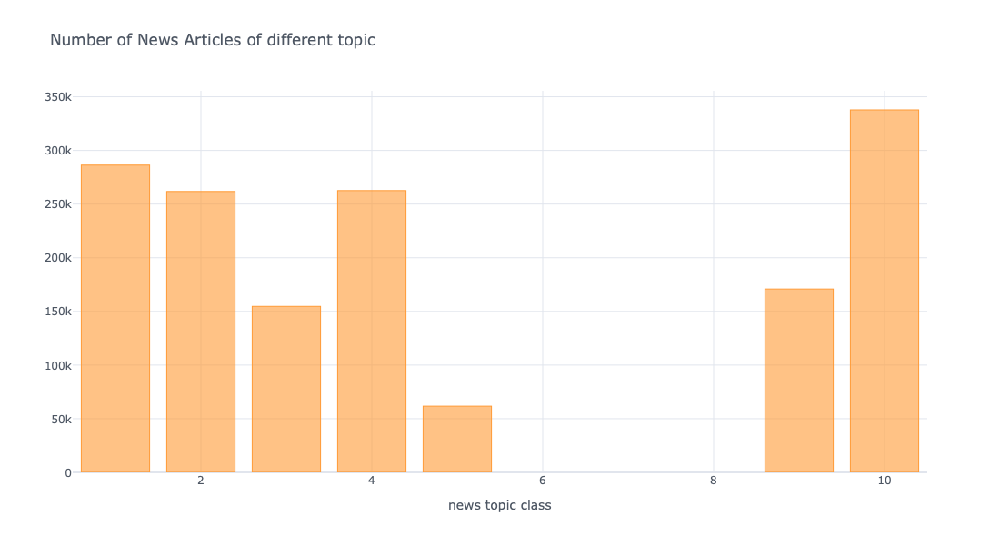

In [48]:
pd.DataFrame((df_news.query('pred_class!=0 and Probability>0.7')).groupby('pred_class')['NewsArticleId'].count()).\
        iplot(kind='bar',title='Number of News Articles of different topic',xTitle='news topic class')

In [49]:
# list(set(data_id).difference(set(df_newclf_id))) # b中有而a中没有的 

Query conflict news topic

In [476]:
df_conflict = df_news.query('pred_class == 1')

In [477]:
df_conflict.shape

(836545, 19)

In [546]:
# df_conflict.query('Probability<0.5 and Probability>0.1').head(50)

In [479]:
df_conflict.head(4).query('Probability == 0.7325').iloc[0:1,:]

,NewsArticleId,date,date_int,Symantic,LocationId,LocationName,CountryCode,FeatureCode,FeatureClass,CountryGeoNameId,StateCode,StateGeoNameId,Population,Longitude,Latitude,Frequency,Probability,pred_class,LocationTypeId
273,76676bd48f634233b62f4748a5ac3bd2,2021-11-01,20211101,-0.9959,6569825.0,Impasug-Ong,PH,ADM3,A,1694008.0,10,7521295.0,47859.0,125.11694,8.41222,2.0,0.7325,1,2


In [547]:
def Processing_HP(dataset):
    # select highest probability news article
    new_df = pd.DataFrame()
    id_list = list(dataset.NewsArticleId.unique())
    for id in tqdm(id_list):
        news = dataset.query('Probability >0.1 and NewsArticleId=="{}"'.format(id))
        # if len(news) > 1:
        #     news = news.iloc[1:2,:]
        # else:
        #     news = news.iloc[0:1,:]
            
        new_df = pd.concat([new_df, news])
    
    # sort values by date
    new_df.sort_values(by=['date_int'], ascending=False,inplace=True)
    new_df.reset_index(drop=True,inplace=True)
    # convert 2code to 3code
    new_df['CountryCode3'] = new_df['CountryCode'].apply(lambda x: Pycountry_2_to_3(x))
    
    return new_df

In [548]:
%%time
df_con_HP = Processing_HP(df_conflict)

100%|█████████████████████████████████████| 78202/78202 [26:04<00:00, 50.00it/s]


CPU times: user 23min 8s, sys: 2min 55s, total: 26min 3s
Wall time: 26min 4s


In [93]:
df_con_HP.shape

(78007, 20)

In [549]:
df_con_HP.to_csv('data/conflict_news_v3_p01.csv')

In [61]:
len(df_con_HP.NewsArticleId.unique())

78007

# 4. Design Conflict Score

Load news articles in conflict topic

In [3]:
df = pd.read_csv('data/conflict_news_v2.csv',index_col=0)

**The risk of internal conflict:** 

this can be graded from, for example, the assault on Capitol Hill to the deaths around drugs cartels in Mexico. I think including violent deaths would be important as a way of scaling the indicator which, mapped with an index from the news stories)

**The risks from external conflict:**

again, this can be graded in terms of diplomatic skirmishes to full blown war. The various conflict databases will help isolate deaths and incidents as a result of external conflict

However, at this stage we do not distinguish internal and external conflict.

In [4]:
df.head(1)

,NewsArticleId,date,date_int,Symantic,LocationId,LocationName,CountryCode,FeatureCode,FeatureClass,CountryGeoNameId,StateCode,StateGeoNameId,Population,Longitude,Latitude,Frequency,Probability,pred_class,LocationTypeId,CountryCode3
0,8d7f87926bd4408a9cd4b5bf12bd88d5,2022-08-22,20220822,-0.997,706757.0,Soledar,UA,PPL,P,690791.0,05,709716.0,12662.0,38.08902,48.67935,27.0,0.7325,1,1,UKR


In [5]:
df.isnull().sum()

NewsArticleId           0
date                    0
date_int                0
Symantic                0
LocationId              0
LocationName            0
CountryCode             8
FeatureCode             7
FeatureClass            0
CountryGeoNameId        0
StateCode              17
StateGeoNameId      29407
Population              0
Longitude               0
Latitude                0
Frequency               0
Probability             0
pred_class              0
LocationTypeId          7
CountryCode3           74
dtype: int64

In [6]:
# drop null values in column CountryCode3
df = df.query('CountryCode3 == CountryCode3')

In [7]:
df.shape

(77933, 20)

## 4.1 EDA

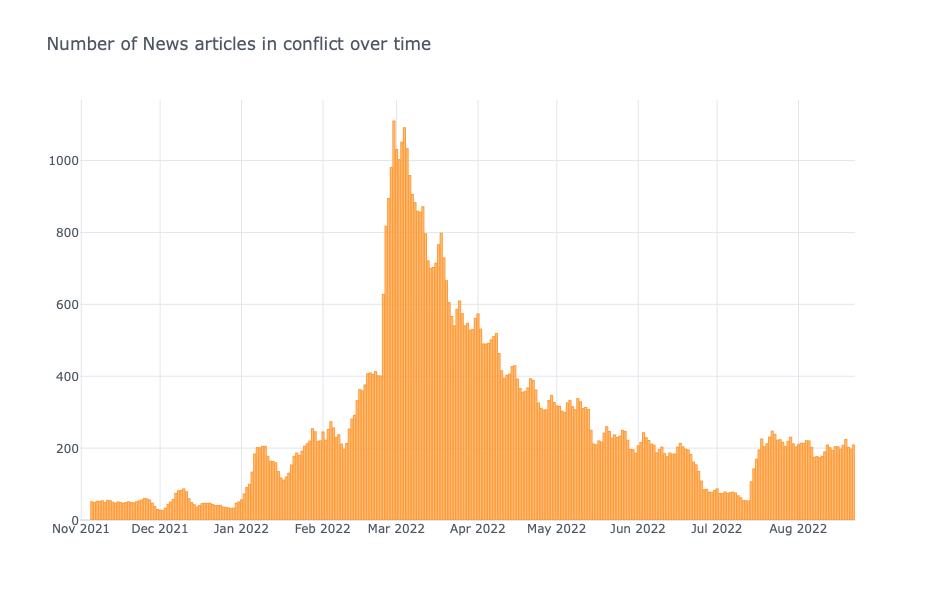

In [8]:
# plot number of news articles overtime
con = pd.DataFrame(df.groupby(['date'])['NewsArticleId'].count()).reset_index().set_index('date')
con.rolling(window=5).mean().iplot(kind='bar', title='Number of News articles in conflict over time')

It peaks in Feb 2022 when Ukraine was invaded.

In [9]:
# groupby country over time
def number_country_news(dataset,Code3List):
    countries = pd.DataFrame()
    window_length = 7
    for code in Code3List:
        country = dataset.query('CountryCode3 == "{}"'.format(code))
        country = pd.DataFrame(country.groupby(['date'])['NewsArticleId'].count()).reset_index().set_index('date')\
                                                .rename(columns={'NewsArticleId':'{}'.format(code)}).rolling(window=window_length).mean()
        countries = pd.concat([countries, country],axis=1)
    return countries

In [10]:
# map 3alphabet country code to country name
def Pycountry_3_to_name(alpha_3):
    try:
        return pycountry.countries.get(alpha_3=alpha_3).name
    except:
        return "None"

In [11]:
# display country name
Code3List = ["USA","GBR","CHN","FRA",'DEU','CAN','ITA','JPN','UKR','RUS','LKA','TJK','TWN','ZAF']
for i in Code3List:
    print(Pycountry_3_to_name(i))

United States
United Kingdom
China
France
Germany
Canada
Italy
Japan
Ukraine
Russian Federation
Sri Lanka
Tajikistan
Taiwan, Province of China
South Africa


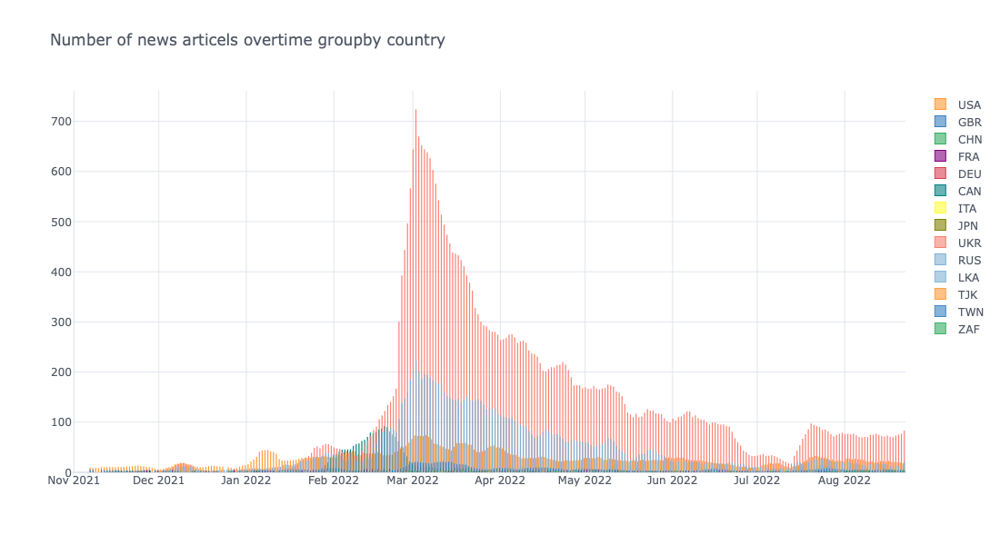

In [12]:
# plot the number of news articles in different country
countries = number_country_news(df,Code3List)
countries.iplot(kind='bar',title = 'Number of news articels overtime groupby country')

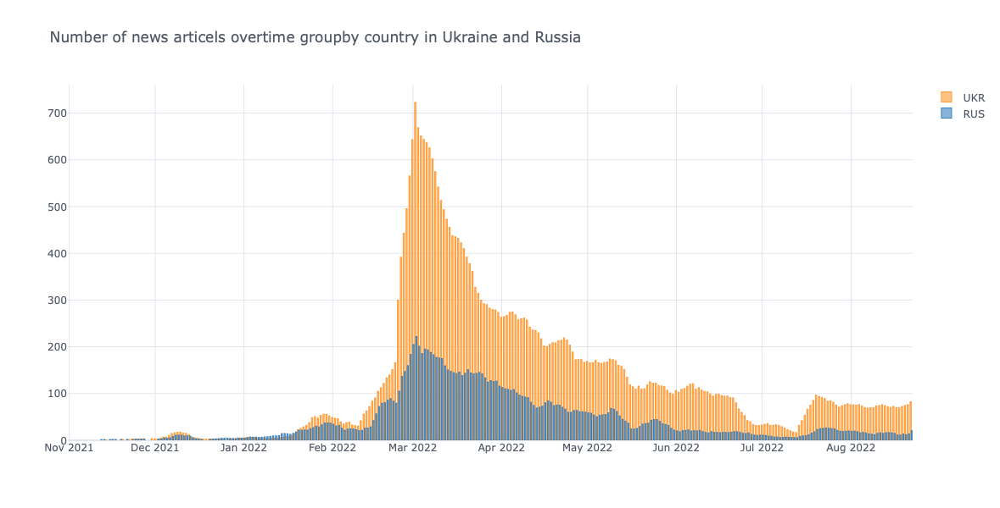

In [13]:
# plot number of news in Ukraine, Russia
Code3List = ['UKR','RUS']
countries = number_country_news(df,Code3List)
countries.iplot(kind='bar',title = 'Number of news articels overtime groupby country in Ukraine and Russia')

One of the issues is that a significant decrease after the war breakout. It is not true since the war has not came to an end. To address this problem, I add a sentiment strength, country class, population, captical as variables to adjust it.

In [14]:
# capital city names
capital_city_names = pd.read_excel('data/capital_city_names.xlsx').iloc[:,:-1]

In [15]:
capital_city_names

,country,capital_city
0,Afghanistan,Kabul
1,Albania,Tirana
2,Algeria,Algiers
3,Andorra,Andorra la Vella
4,Angola,Luanda
...,...,...
197,Venezuela,Caracas
198,Vietnam,Hanoi
199,Yemen,Sana'a
200,Zambia,Lusaka


In [16]:
# check if location name is capital 
capital_city_names_list = capital_city_names.capital_city.to_list()
df['is_capital'] = df['LocationName'].apply(lambda x : "yes" if x in capital_city_names_list else "no")

In [17]:
df.head(1)

,NewsArticleId,date,date_int,Symantic,LocationId,LocationName,CountryCode,FeatureCode,FeatureClass,CountryGeoNameId,StateCode,StateGeoNameId,Population,Longitude,Latitude,Frequency,Probability,pred_class,LocationTypeId,CountryCode3,is_capital
0,8d7f87926bd4408a9cd4b5bf12bd88d5,2022-08-22,20220822,-0.997,706757.0,Soledar,UA,PPL,P,690791.0,05,709716.0,12662.0,38.08902,48.67935,27.0,0.7325,1,1,UKR,no


In [18]:
round(df.query('is_capital =="yes"').shape[0] / df.shape[0], 4)

0.1199

Aound 12% locations is capital city. Assume the influence of conflict happped in capital is higher than non-capital cities

* Assign weight 1 to capital city otherwise 0

In [19]:
df['Capital_Weight'] = df['is_capital'].apply(lambda x : 1 if x=="yes" else 0)

In [20]:
df.head(1)

,NewsArticleId,date,date_int,Symantic,LocationId,LocationName,CountryCode,FeatureCode,FeatureClass,CountryGeoNameId,StateCode,StateGeoNameId,Population,Longitude,Latitude,Frequency,Probability,pred_class,LocationTypeId,CountryCode3,is_capital,Capital_Weight
0,8d7f87926bd4408a9cd4b5bf12bd88d5,2022-08-22,20220822,-0.997,706757.0,Soledar,UA,PPL,P,690791.0,05,709716.0,12662.0,38.08902,48.67935,27.0,0.7325,1,1,UKR,no,0


* Assign weight 0 if sentiment values lies in (-0.98, +0.98)
* Assign weight -1 if sentiment values > 0.98, since a positive sentiment migitage conflict strength
* Assign weight +1 if sentiment values > 0.98, since a negative sentiment increases conflict strength

In [21]:
# define a funciton a assign weight based on sentiment values
def SA_Weight(x):
    # netural 
    if x < 0.98 and x > -0.98:
        w = 0
    # postive
    elif x > 0.98:
        w = -1
    # negative 
    else:
        w = 1
    return w   

In [22]:
df['SA_Weight'] = df['Symantic'].apply(lambda x : SA_Weight(x))

In [23]:
df.head(1)

,NewsArticleId,date,date_int,Symantic,LocationId,LocationName,CountryCode,FeatureCode,FeatureClass,CountryGeoNameId,StateCode,StateGeoNameId,Population,Longitude,Latitude,Frequency,Probability,pred_class,LocationTypeId,CountryCode3,is_capital,Capital_Weight,SA_Weight
0,8d7f87926bd4408a9cd4b5bf12bd88d5,2022-08-22,20220822,-0.997,706757.0,Soledar,UA,PPL,P,690791.0,05,709716.0,12662.0,38.08902,48.67935,27.0,0.7325,1,1,UKR,no,0,1


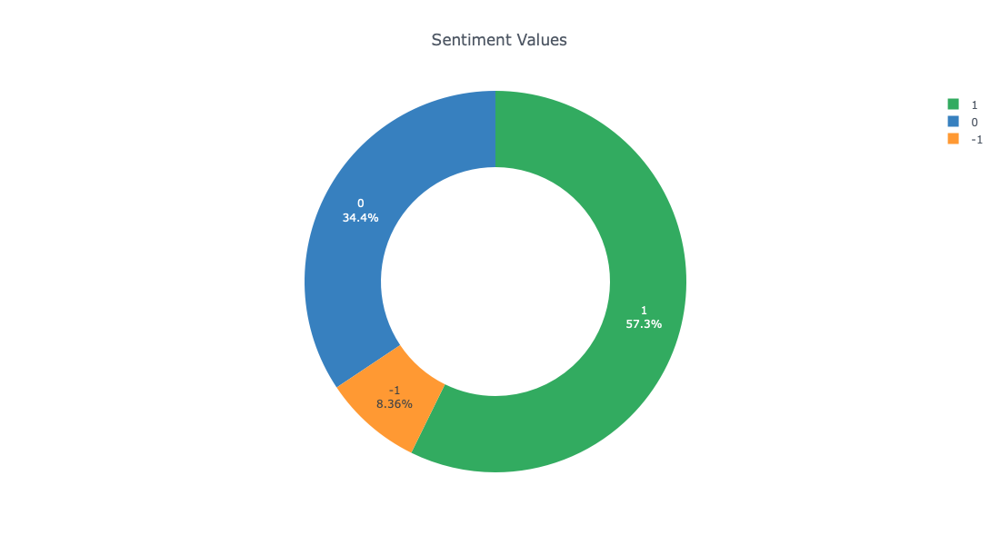

In [78]:
# Plot Sentiment values in percentage
df_polarity = pd.DataFrame(df.groupby(['SA_Weight'])['NewsArticleId'].count())
df_polarity.reset_index().iplot(kind='pie',
                                labels='SA_Weight',
                                values="NewsArticleId",
                                textinfo='percent+label', 
                                hole=.6,title ='Sentiment Values')

The pie chart shows that 57.3% news articels is negative (1 denotes negative sentiment), 34.4% is netural and 8.36% is postive sentiment.

* Base weight set as 1, underlying value 1 is the number of news article

In [24]:
df['Base_Weight'] = 1

In [25]:
df.head(1)

,NewsArticleId,date,date_int,Symantic,LocationId,LocationName,CountryCode,FeatureCode,FeatureClass,CountryGeoNameId,StateCode,StateGeoNameId,Population,Longitude,Latitude,Frequency,Probability,pred_class,LocationTypeId,CountryCode3,is_capital,Capital_Weight,SA_Weight,Base_Weight
0,8d7f87926bd4408a9cd4b5bf12bd88d5,2022-08-22,20220822,-0.997,706757.0,Soledar,UA,PPL,P,690791.0,05,709716.0,12662.0,38.08902,48.67935,27.0,0.7325,1,1,UKR,no,0,1,1


In [26]:
df.shape

(77933, 24)

* Assigh 1 weight if location is a G20 country, else 0, since a conflict occurs in G20 countries has more influence to society stability

In [27]:
G20 = ['CN', 'IN', 'US','ID', 'BR', 'RU', 'JP', 'MX', 'DE', 'TR', 'FR', 'GB', 'IT', 'ZA', 'KR', 'AR', 'CA', 'SA', 'AU']
G20 = [Pycountry_2_to_3(i) for i in G20]

In [28]:
df['G20_Weight'] = df['CountryCode3'].apply(lambda x : 1 if x in G20 else 0)

In [29]:
df.head(1)

,NewsArticleId,date,date_int,Symantic,LocationId,LocationName,CountryCode,FeatureCode,FeatureClass,CountryGeoNameId,StateCode,StateGeoNameId,Population,Longitude,Latitude,Frequency,Probability,pred_class,LocationTypeId,CountryCode3,is_capital,Capital_Weight,SA_Weight,Base_Weight,G20_Weight
0,8d7f87926bd4408a9cd4b5bf12bd88d5,2022-08-22,20220822,-0.997,706757.0,Soledar,UA,PPL,P,690791.0,05,709716.0,12662.0,38.08902,48.67935,27.0,0.7325,1,1,UKR,no,0,1,1,0


* Add G20_Weight, Capital_Weight, SA_Weight, Base_Weight

* TODO: Other factors, such as population, country classes (less developed, developed, etc), can be considered to adjust this score.

In [30]:
df['Total_Weight'] = df.apply(lambda x : (x['G20_Weight'] + 
                                          x['Capital_Weight'] + 
                                          x['SA_Weight'] + 
                                          x['Base_Weight']), axis=1) 

In [31]:
# define a funciton to calculate the conflict score groupby time range and country name
def scoring(dataset,Code3List):
    countries = pd.DataFrame()
    window_length = 7
    for code in Code3List:
        country = dataset.query('CountryCode3 == "{}"'.format(code))
        country = pd.DataFrame(country.groupby(['date'])['Total_Weight'].sum()).reset_index().set_index('date')\
                                                .rename(columns={'Total_Weight':'{}'.format(code)}).rolling(window=window_length).mean()
        countries = pd.concat([countries, country],axis=1)
    return countries

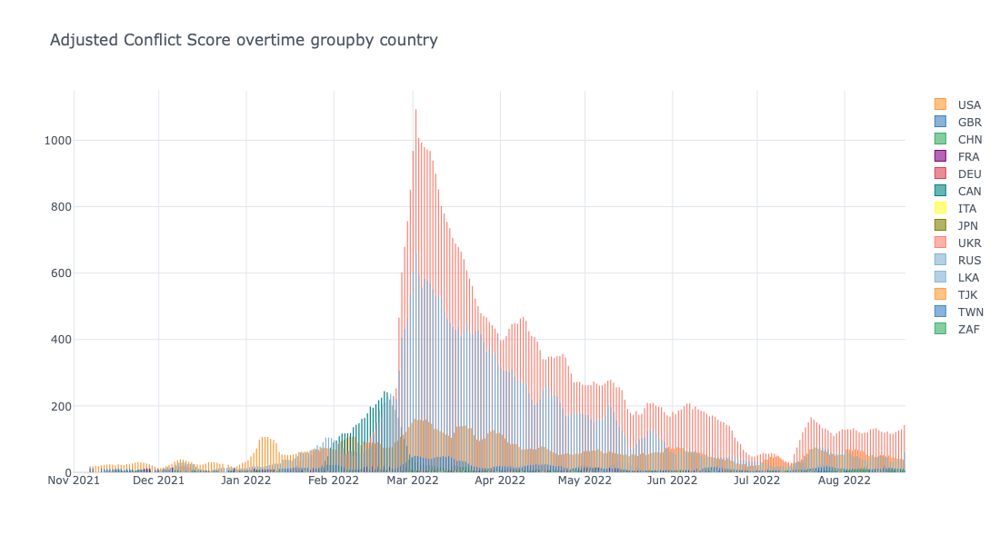

In [32]:
Code3List = ["USA","GBR","CHN","FRA",'DEU','CAN','ITA','JPN','UKR','RUS','LKA','TJK','TWN','ZAF']
countries = scoring(df,Code3List)
countries.iplot(kind='bar',title = 'Adjusted Conflict Score overtime groupby country')

In [33]:
# plot number of news in Ukraine, Russia and Poland
def compare_country_adj_score(country3code:str):
    Code3List = [country3code]
    adj = scoring(df,Code3List).rename(columns={Code3List[0]:'Adj_'+Code3List[0]})
    ori = number_country_news(df,Code3List)
    conbined = pd.concat([adj, ori],axis=1)
    return conbined

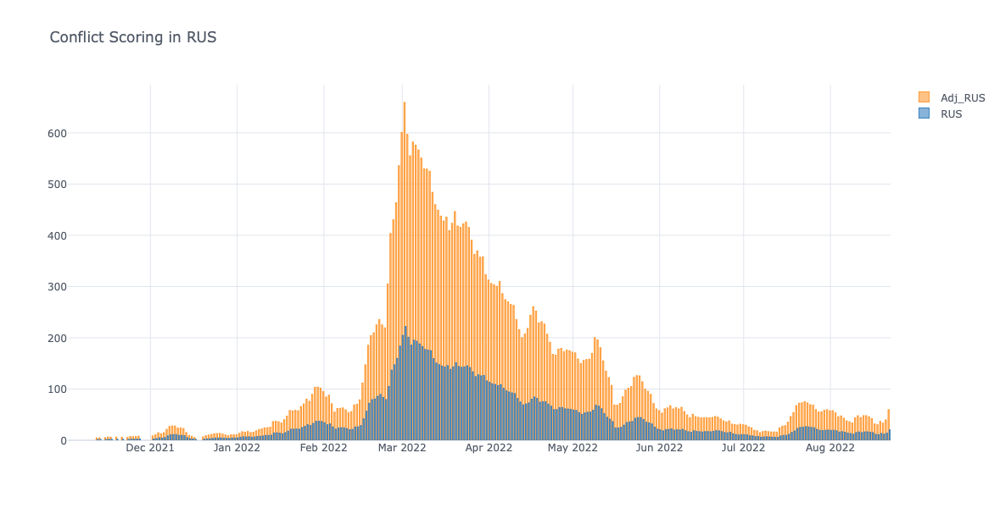

In [34]:
rus_scores = compare_country_adj_score(country3code = "RUS")
rus_scores.iplot(kind = 'bar',title='Conflict Scoring in RUS')

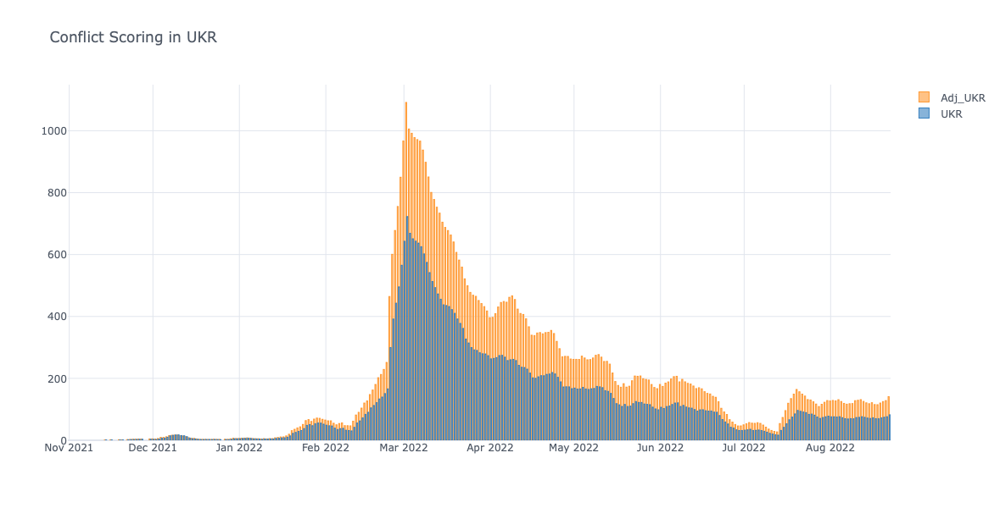

In [35]:
# compare adjusted conflict score with original score
ukr_scores = compare_country_adj_score(country3code = "UKR")
ukr_scores.iplot(kind = 'bar',title='Conflict Scoring in UKR')

In [36]:
ukr_scores.tail(1)

,Adj_UKR,UKR
date,,
2022-08-22,141.0,82.285714


In [37]:
rus_scores

,Adj_RUS,RUS
date,,
2021-11-02,NaN,NaN
2021-11-03,NaN,NaN
2021-11-05,NaN,NaN
2021-11-08,NaN,NaN
2021-11-09,NaN,NaN
...,...,...
2022-08-18,30.285714,11.000000
2022-08-19,36.714286,13.285714
2022-08-20,33.428571,11.857143


In [38]:
ukr_scores['adj_chg_ukr'] = ukr_scores['Adj_UKR'].pct_change(1)
rus_scores['adj_chg_rus'] = rus_scores['Adj_RUS'].pct_change(1)

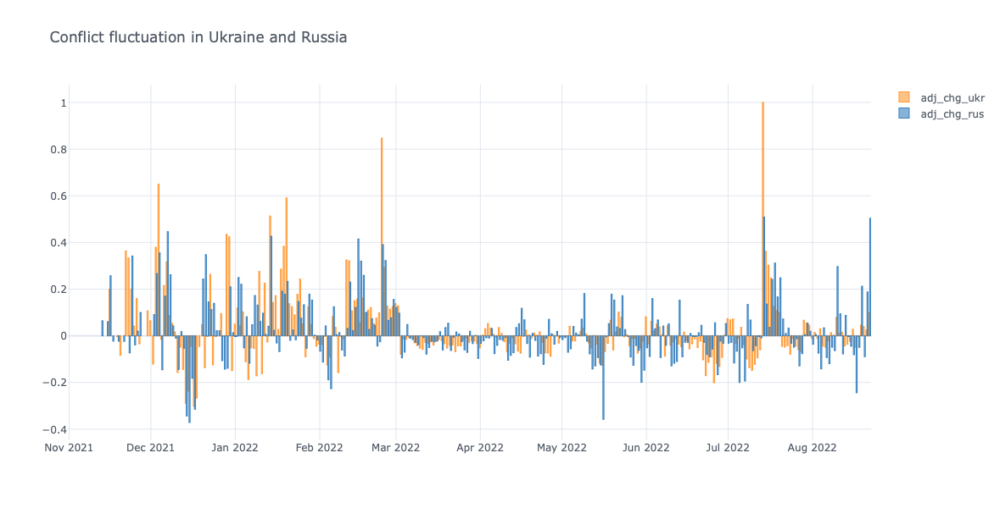

In [39]:
# plot conflict one day percentage change
pd.concat([ukr_scores[['adj_chg_ukr']], rus_scores[['adj_chg_rus']]], axis=1)\
                                    .iplot(kind='bar',title='Conflict fluctuation in Ukraine and Russia')

* By examining the charts above, we can see that the adjusted conflict scores of UKR and RUS still decrease after the war breakout though the percentage changes match. To address this issue, I set the sum of total weight in G20 countries as benchmark with a time period.

In [40]:
# G20 countries
G20 = ['CN', 'IN', 'US','ID', 'BR', 'RU', 'JP', 'MX', 'DE', 'TR', 'FR', 'GB', 'IT', 'ZA', 'KR', 'AR', 'CA', 'SA', 'AU']
G20 = [Pycountry_2_to_3(i) for i in G20]
print(G20)

['CHN', 'IND', 'USA', 'IDN', 'BRA', 'RUS', 'JPN', 'MEX', 'DEU', 'TUR', 'FRA', 'GBR', 'ITA', 'ZAF', 'KOR', 'ARG', 'CAN', 'SAU', 'AUS']


In [41]:
df.head(1)

,NewsArticleId,date,date_int,Symantic,LocationId,LocationName,CountryCode,FeatureCode,FeatureClass,CountryGeoNameId,StateCode,StateGeoNameId,Population,Longitude,Latitude,Frequency,Probability,pred_class,LocationTypeId,CountryCode3,is_capital,Capital_Weight,SA_Weight,Base_Weight,G20_Weight,Total_Weight
0,8d7f87926bd4408a9cd4b5bf12bd88d5,2022-08-22,20220822,-0.997,706757.0,Soledar,UA,PPL,P,690791.0,05,709716.0,12662.0,38.08902,48.67935,27.0,0.7325,1,1,UKR,no,0,1,1,0,2


In [42]:
# groupby date
pd.DataFrame(df.groupby(['date','CountryCode3'])['Total_Weight'].sum())

Total_Weight
date       CountryCode3              
2021-11-01 AFG                      6
           AUS                      3
           COL                      1
           EGY                      1
           ETH                     15
...                               ...
2022-08-22 UGA                      1
           UKR                    199
           USA                     31
           YEM                      3
           ZAF                      3

[8281 rows x 1 columns]

In [43]:
# calculate the sum of total weight groupy by date and country
total_weight_sum = pd.DataFrame(df.groupby(['date','CountryCode3'])['Total_Weight'].sum()).\
                    reset_index().set_index('date').rename(columns={'Total_Weight' : 'total_weight_sum'}).reset_index()
total_weight_sum

,date,CountryCode3,total_weight_sum
0,2021-11-01,AFG,6
1,2021-11-01,AUS,3
2,2021-11-01,COL,1
3,2021-11-01,EGY,1
4,2021-11-01,ETH,15
...,...,...,...
8276,2022-08-22,UGA,1
8277,2022-08-22,UKR,199
8278,2022-08-22,USA,31
8279,2022-08-22,YEM,3


In [44]:
# define a function to calcute the Conflict score, which is sum of total weight of a single country  devided by 
# the sum of total weight in G20
def TotalWeight_by_G20sum(dataset):
    new_dataset = pd.DataFrame()
    date_list = list(dataset.date.unique())
    for date in date_list:
        daily = dataset.query('date == "{}"'.format(date))
        daily['all_country_weight_avg'] = daily['total_weight_sum'].mean()
        daily['is_G20'] = daily['CountryCode3'].apply(lambda x : 1 if x in G20 else 0)
        daily['G20_sum'] = daily.query('is_G20==1')['total_weight_sum'].sum()
        daily['Conflict Score'] = round(daily['total_weight_sum'] / daily['G20_sum'],3) * 100
       
        new_dataset = pd.concat([new_dataset, daily],ignore_index=True)

    return new_dataset.set_index(['date'])

In [45]:
df_benchMark = TotalWeight_by_G20sum(total_weight_sum)
df_benchMark

,CountryCode3,total_weight_sum,all_country_weight_avg,is_G20,G20_sum,Conflict Score
date,,,,,,
2021-11-01,AFG,6,6.923077,0,43,14.0
2021-11-01,AUS,3,6.923077,1,43,7.0
2021-11-01,COL,1,6.923077,0,43,2.3
2021-11-01,EGY,1,6.923077,0,43,2.3
2021-11-01,ETH,15,6.923077,0,43,34.9
...,...,...,...,...,...,...
2022-08-22,UGA,1,15.088235,0,228,0.4
2022-08-22,UKR,199,15.088235,0,228,87.3
2022-08-22,USA,31,15.088235,1,228,13.6


In [46]:
# daily = total_weight_sum.query('date == "2021-11-01"')
# daily['all_country_weight_avg'] = daily['total_weight_sum'].mean()
# daily['is_G20'] = daily['CountryCode3'].apply(lambda x : 1 if x in G20 else 0)
# daily['G20_sum'] = daily.query('is_G20==1')['total_weight_sum'].sum()
# daily['country_weight_by_G20_sum'] = daily['total_weight_sum'] / daily['G20_sum']

In [47]:
Code3List = ["USA","GBR","CHN","FRA",'DEU','CAN','ITA','JPN','UKR','RUS','LKA','ETH']
Con_G20_BM= pd.DataFrame()

for i in Code3List:
    df_20 = df_benchMark.query('CountryCode3 == "{}"'.format(i))
    df_20 = df_20[['Conflict Score']].rolling(window=7).mean()
    df_20 = df_20.rename(columns = {'Conflict Score':i})
    Con_G20_BM = pd.concat([Con_G20_BM, df_20],axis=1)

In [48]:
# conflict scores
Con_G20_BM

,USA,GBR,CHN,FRA,DEU,CAN,ITA,JPN,UKR,RUS,LKA,ETH
date,,,,,,,,,,,,
2021-11-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-11-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-11-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-11-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-11-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-19,31.485714,6.628571,NaN,1.785714,2.257143,7.071429,NaN,NaN,88.871429,25.828571,NaN,5.942857
2022-08-20,31.857143,6.571429,3.157143,NaN,NaN,NaN,NaN,NaN,102.314286,25.928571,NaN,6.371429
2022-08-21,30.428571,6.500000,NaN,NaN,NaN,6.557143,NaN,NaN,102.571429,30.857143,NaN,NaN


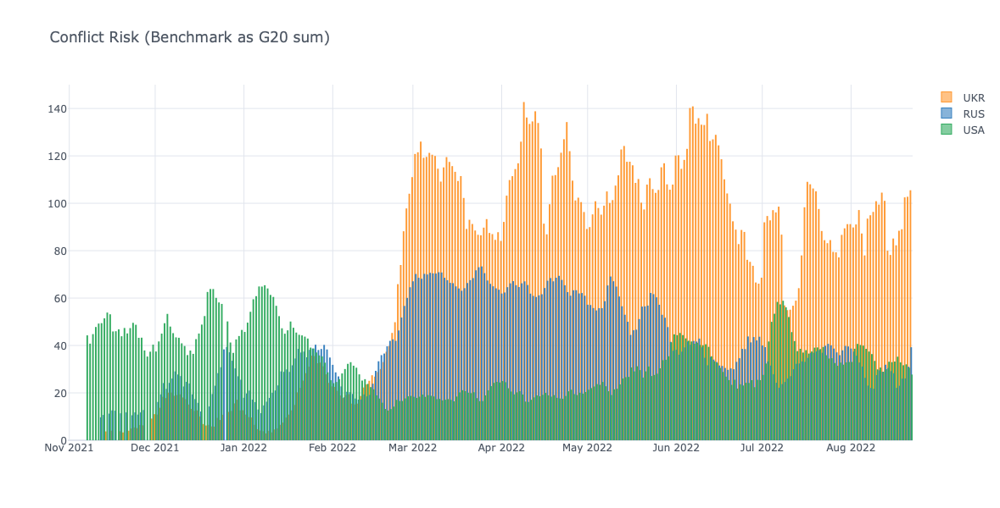

In [49]:
# plot the conflict score in USA, RUS and UKR, where the benchmark is the sum of total weight in G20
Con_G20_BM[['UKR','RUS','USA']].iplot(kind = 'bar', title = 'Conflict Risk (Benchmark as G20 sum)')

* The bar chart shows that the conflict risk score does not decrease significately and holds to some extend, which meets expectation, after setting benchmark.

In [50]:
for i in ['LKA','GBR','CAN']:
    print(Pycountry_3_to_name(i))

Sri Lanka
United Kingdom
Canada


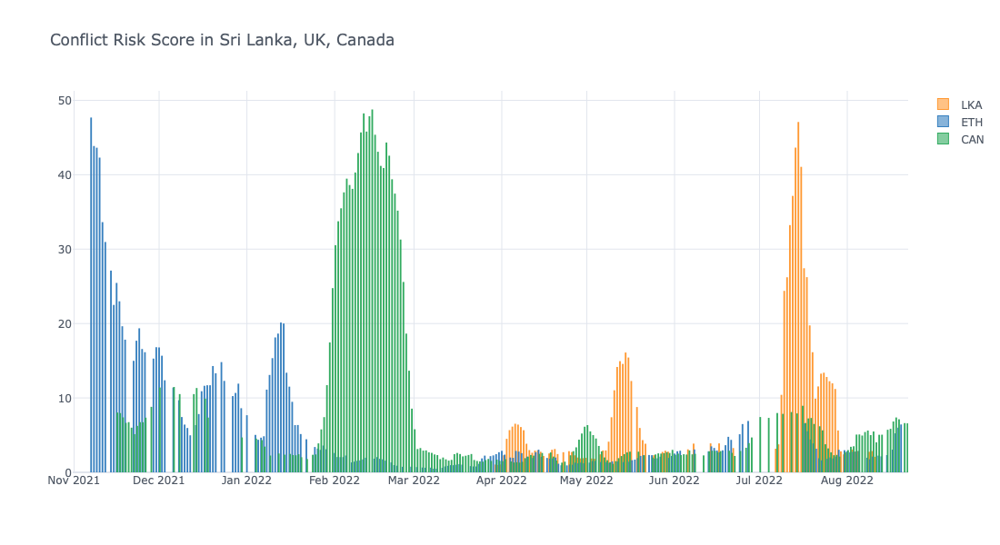

In [51]:
# plot conflict risk score in Sri Lanka, UK and Canada
Con_G20_BM[['LKA','ETH','CAN']].iplot(kind = 'bar', title = 'Conflict Risk Score in Sri Lanka, UK, Canada')

In [67]:
# conflict score in UKR, RUS and USA
ukr_rus_usa = Con_G20_BM[['UKR','RUS','USA']]

# five-days moving average
ukr_rus_usa['UKR_MV'] = ukr_rus_usa['UKR'].rolling(window = 5).mean()
ukr_rus_usa['RUS_MV'] = ukr_rus_usa['RUS'].rolling(window = 5).mean()
ukr_rus_usa['USA_MV'] = ukr_rus_usa['USA'].rolling(window = 5).mean()

# five-days percentage change
ukr_rus_usa['UKR_CHG'] = ukr_rus_usa['UKR'].pct_change(5)
ukr_rus_usa['RUS_CHG'] = ukr_rus_usa['RUS'].pct_change(5)
ukr_rus_usa['USA_CHG'] = ukr_rus_usa['USA'].pct_change(5)

ukr_rus_usa

,UKR,RUS,USA,UKR_MV,RUS_MV,USA_MV,UKR_CHG,RUS_CHG,USA_CHG
date,,,,,,,,,
2021-11-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-11-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-11-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-11-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-11-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
2022-08-19,88.871429,25.828571,31.485714,84.431429,25.540000,33.011429,0.113677,-0.148776,-0.044647
2022-08-20,102.314286,25.928571,31.857143,89.291429,24.925714,32.825714,0.311481,-0.105911,-0.028322
2022-08-21,102.571429,30.857143,30.428571,92.814286,25.477143,32.305714,0.207331,0.098119,-0.078720


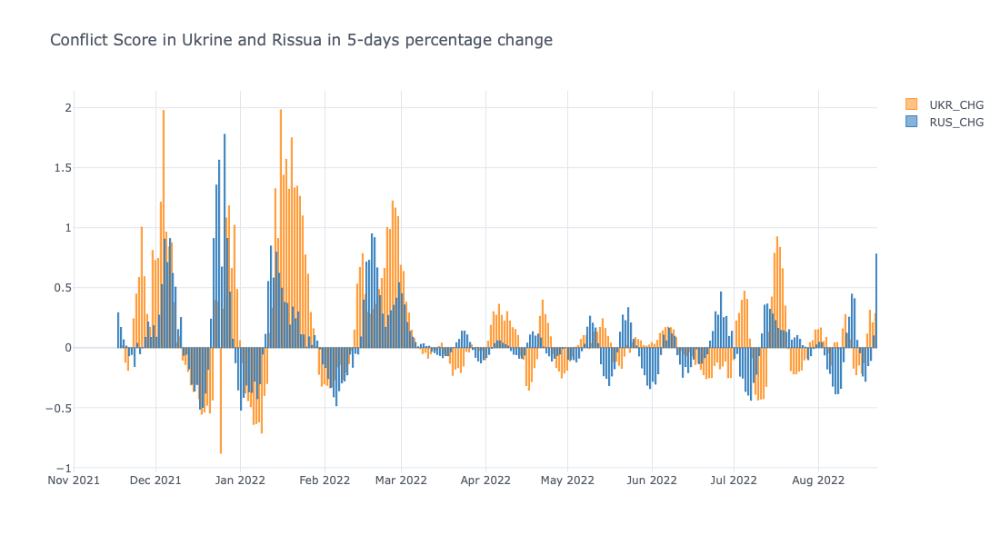

In [71]:
ukr_rus_usa[['UKR_CHG','RUS_CHG']].iplot(kind='bar', title = 'Conflict Score in Ukrine and Rissua in 5-days percentage change')

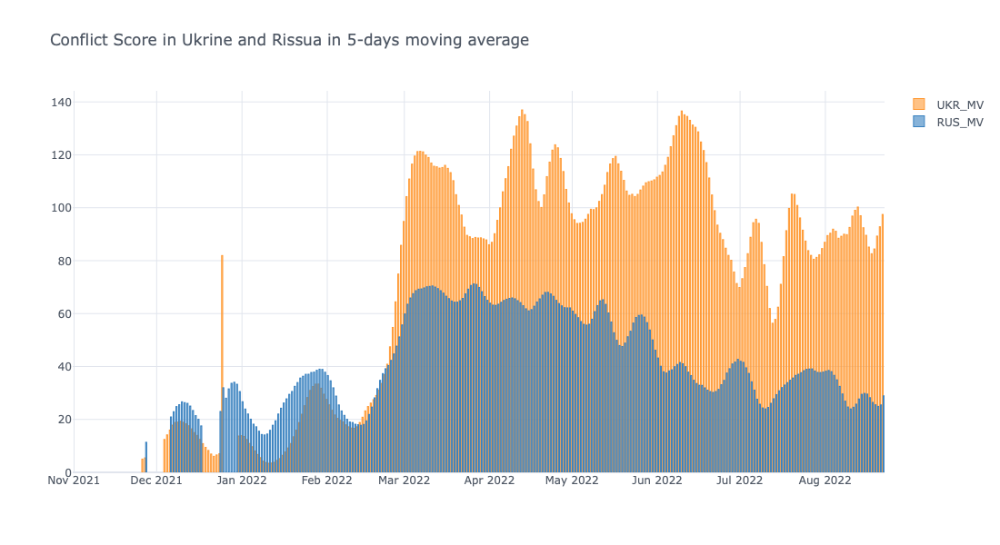

In [72]:
ukr_rus_usa[['UKR_MV','RUS_MV']].iplot(kind='bar', title = 'Conflict Score in Ukrine and Rissua in 5-days moving average')

Plot conflict score in choropleth

In [52]:
df_benchMark['country_name'] = df_benchMark['CountryCode3'].apply(lambda x : Pycountry_3_to_name(x))
df_benchMark.reset_index()

,date,CountryCode3,total_weight_sum,all_country_weight_avg,is_G20,G20_sum,Conflict Score,country_name
0,2021-11-01,AFG,6,6.923077,0,43,14.0,Afghanistan
1,2021-11-01,AUS,3,6.923077,1,43,7.0,Australia
2,2021-11-01,COL,1,6.923077,0,43,2.3,Colombia
3,2021-11-01,EGY,1,6.923077,0,43,2.3,Egypt
4,2021-11-01,ETH,15,6.923077,0,43,34.9,Ethiopia
...,...,...,...,...,...,...,...,...
8276,2022-08-22,UGA,1,15.088235,0,228,0.4,Uganda
8277,2022-08-22,UKR,199,15.088235,0,228,87.3,Ukraine
8278,2022-08-22,USA,31,15.088235,1,228,13.6,United States
8279,2022-08-22,YEM,3,15.088235,0,228,1.3,Yemen


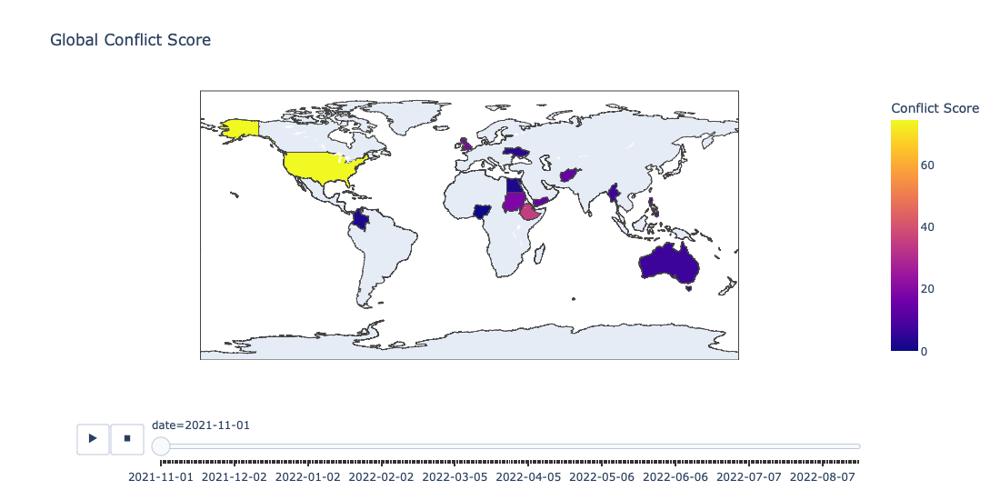

In [53]:
fig = px.choropleth(df_benchMark.reset_index(), locations="CountryCode3",
                    color="Conflict Score", hover_name="country_name", animation_frame="date",
                    color_continuous_scale=px.colors.sequential.Plasma,
                    width = 1100,height = 550,
                    title = 'Global Conflict Score')
fig.show()